# Prediction model temperature forecast Data Set



https://archive.ics.uci.edu/ml/datasets/Bias+correction+of+numerical+prediction+model+temperature+forecast

Data Set Information:

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.



Attribute Information are mentioned below:

For more information, read [Cho et al, 2020].

1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8



#### Importing or calling all necessary models

In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from scipy.stats import zscore
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')

## DataSet:
### Loading / Cleaning / Formatting

In [79]:
df=pd.read_csv('Temperature.csv',parse_dates=[1])
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [80]:
df=pd.DataFrame(data=df)
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [81]:
#First five data rows of the data
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [82]:
#Last five data rows of the data
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaT,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaT,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [83]:
#Shape of the data 
df.shape

(7752, 25)

In [84]:
#Information regarding our data:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

In [85]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


The description of the above dataset entrails the total count followed by mean , standard deviation , minimum , maximum , median , 1st and 3rd quartile.

If we consider the stations among all the attributes then our count is 7750 entries made , our mean or average station is 13 which is having the standard deviation of 7.2, minimum is 1 and maximum is at 25. 

Like wise we could see the detailed information about all other attributes.

### Checking Missing Values

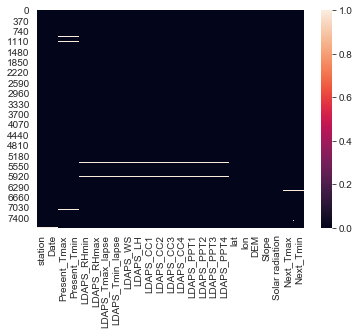

In [86]:
sns.heatmap(df.isnull())

The above graph is here to show that if there are any null values in the above dataset, I have found out that the black color shows the '0' value here, it means that none of the value is empty(Null Values), where the white lines shows the precence of the null values in our dataset.

In order to get more clearity we have taken out the sum of the total Null Values down which is also showing there are null valuess presnt in various data attributes. 

Hence we will be treating the same.

In [87]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [88]:
#Pandas dataframe.ffill() function is used to fill the missing value in the dataframe. ‘ffill’ stands for ‘forward fill’ and will propagate last valid observation forward.
data_frame_list = [df]
for df in data_frame_list:
    df.ffill(inplace=True)
print (data_frame_list)

[      station       Date  Present_Tmax  Present_Tmin  LDAPS_RHmin  \
0         1.0 2013-06-30          28.7          21.4    58.255688   
1         2.0 2013-06-30          31.9          21.6    52.263397   
2         3.0 2013-06-30          31.6          23.3    48.690479   
3         4.0 2013-06-30          32.0          23.4    58.239788   
4         5.0 2013-06-30          31.4          21.9    56.174095   
...       ...        ...           ...           ...          ...   
7747     23.0 2017-08-30          23.3          17.1    26.741310   
7748     24.0 2017-08-30          23.3          17.7    24.040634   
7749     25.0 2017-08-30          23.2          17.4    22.933014   
7750     25.0 2017-08-30          20.0          11.3    19.794666   
7751     25.0 2017-08-30          37.6          29.9    98.524734   

      LDAPS_RHmax  LDAPS_Tmax_lapse  LDAPS_Tmin_lapse   LDAPS_WS    LDAPS_LH  \
0       91.116364         28.074101         23.006936   6.818887   69.451805   
1       90

In [89]:
#Last five data rows of the data
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,25.0,2017-08-30,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,25.0,2017-08-30,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [90]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

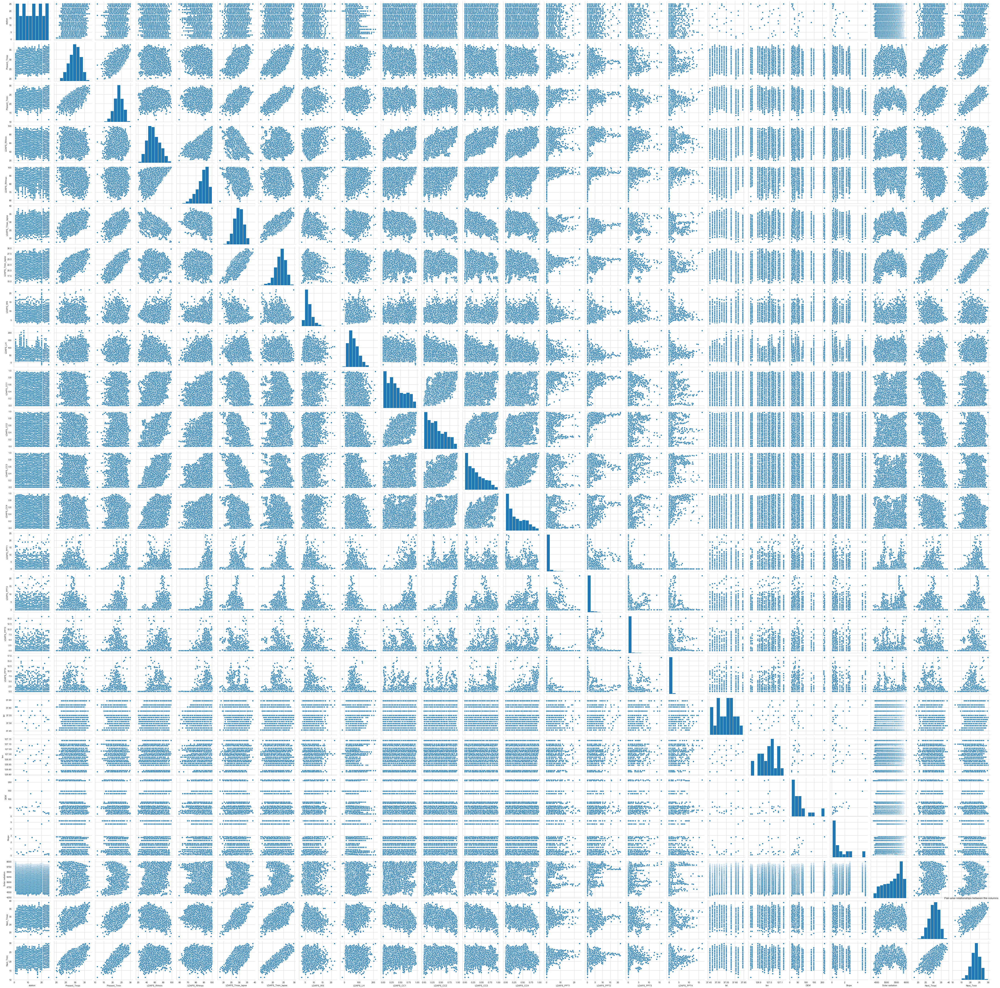

In [91]:
ax = sns.pairplot(df)
plt.title('Pair-wise relationships between the columns')
plt.show()

Pairplot has been constucted above to show or allow us the see both the distribution of each variables and also to show the relationship between each of the two variables, "/" -->shows the positive corelation where as "\\" -->shows negative corelation for some there are holizontal lines which shows neutral relationship with each other.

Through the above and below graph we have come accros to the attributes or the fields which are positively corelated or neutral corelated to each other, Hence we would be taking all of them in to the consideration.

These fields are some what showing neutral correlation with each other.
The below graph shows is the stucture of corelation between each of the variables with respect to the heatmap.

The black dots represent negative corelation where as off white color shows the positive corelation.

There are few field which is showing negative relationship with some of the other fields . We will remove this field before modeling our data.

Here we have two columns as targeted variables:
1. Next_Tmax - Removing negatively correlated columns: LDAPS_RHmin","LDAPS_CC1","LDAPS_CC2","LDAPS_CC3","LDAPS_CC4","LDAPS_WS","Day"
2. Next_Tmin - Removing negatively correlated columns: "LDAPS_PPT4","DEM","Slope","Day","LDAPS_RHmax"

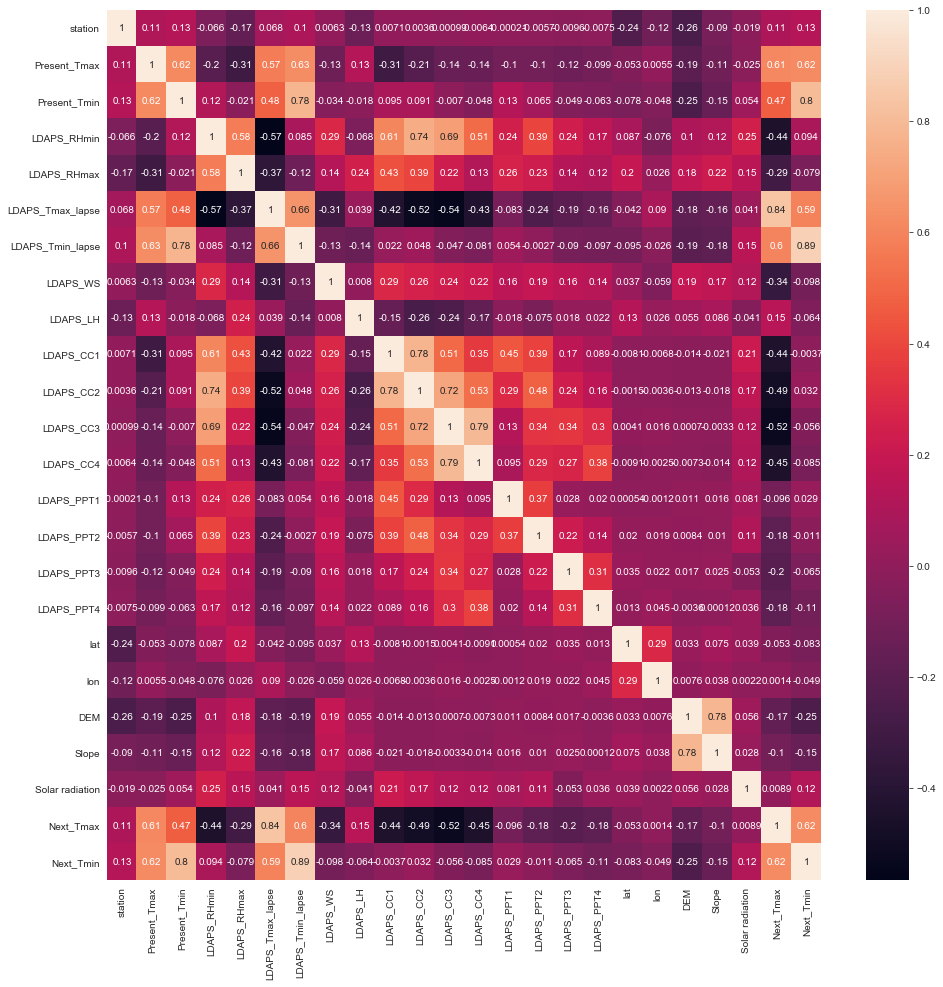

In [92]:
corr_hmap=df.corr()
plt.figure(figsize=(16,16))
sns.heatmap(corr_hmap,annot=True)
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fbad8467090>,
      dtype=object)

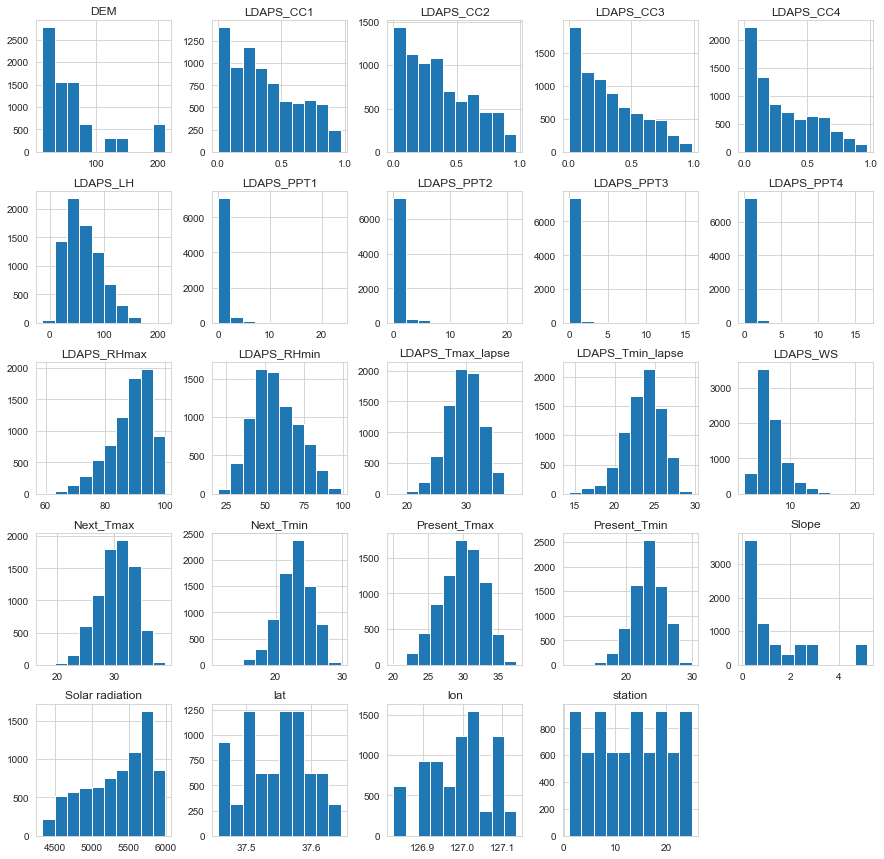

In [93]:
df.hist(figsize=(15,15))

The above histogram graph shows value count of the readings of the various variables:
1. DEM around 70 % of the data show below 50.
2. The occurence of the slope is maximum number of times that is below 2
3. Solar radiation is raning from 5500 to 6000 having the highest number of instances.
4. Present temperatue maximum is highest at 30 where the present temperature minimum is highest at around 24.

Like wise we could identify such readings from the above graphs.

In [94]:
df.columns.to_series().groupby(df.dtypes).groups

{dtype('float64'): Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
        'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
        'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
        'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
        'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
       dtype='object'),
 dtype('<M8[ns]'): Index(['Date'], dtype='object')}

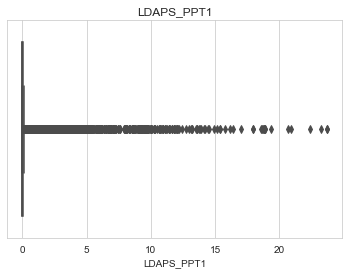

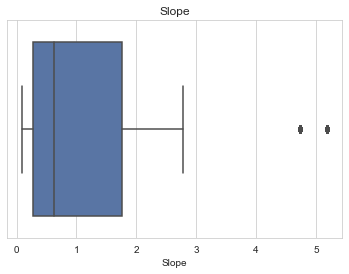

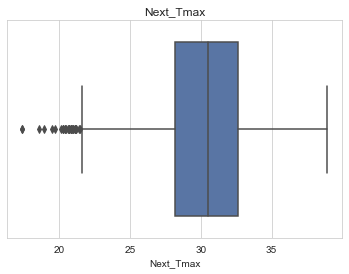

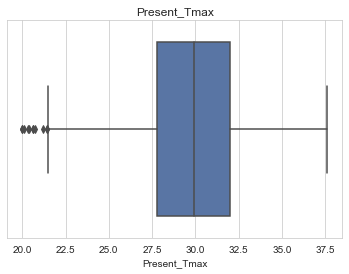

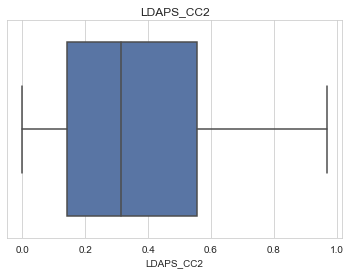

...

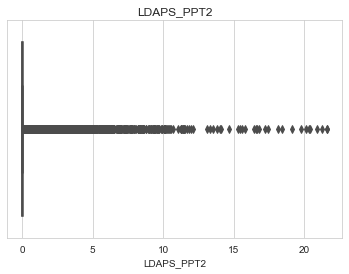

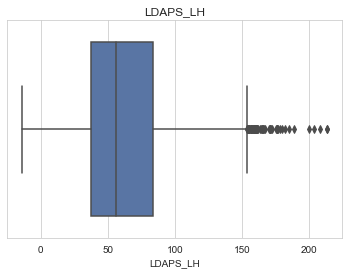

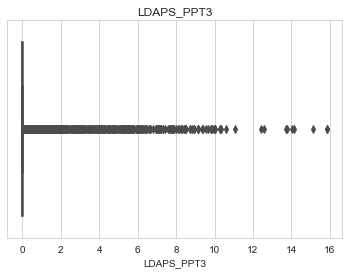

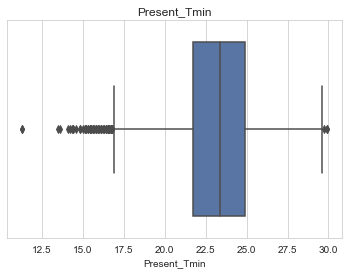

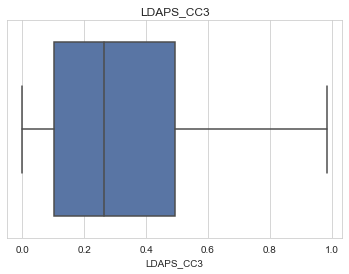

In [95]:
columns={'station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
        'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
        'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
        'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
        'Solar radiation', 'Next_Tmax', 'Next_Tmin'}
for i in columns:
    plt.figure()
    plt.clf()
    sns.boxplot(df[i],palette="deep")
    plt.title(i)
    plt.show()

The plot box situated above are representing the minimum value , maximum value and showing the median value for the variables. 

In some of the variables such as 'Present_Tmax', 'Present_Tmin','LDAPS_RHmax','LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','DEM', 'Slope','Next_Tmax', 'Next_Tmin'etc..
        
The graph shows some poiters above or below the graph which is used to detect if there are any outliers presnt in the datasets or not.

If the detection is accurate then we should be able to treat them in order to get the perfect outcome or result.

Outliers here are the observations that we find at the abnormal distance from other values.

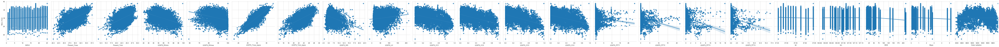

In [96]:
sns.pairplot(df, x_vars=['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
        'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
        'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
        'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
        'Solar radiation'], y_vars='Next_Tmax', size=4, aspect=1, kind='reg')

1. Next_Tmax - Removing negatively correlated columns: LDAPS_RHmin","LDAPS_CC1","LDAPS_CC2","LDAPS_CC3","LDAPS_CC4","LDAPS_WS","Day"


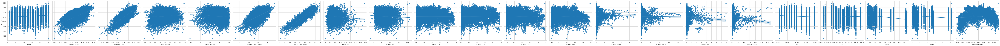

In [97]:
sns.pairplot(df, x_vars=['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
        'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
        'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
        'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
        'Solar radiation'], y_vars='Next_Tmin', size=4, aspect=1, kind='reg')

2. Next_Tmin - Removing negatively correlated columns: "LDAPS_PPT4","DEM","Slope","Day","LDAPS_RHmax"

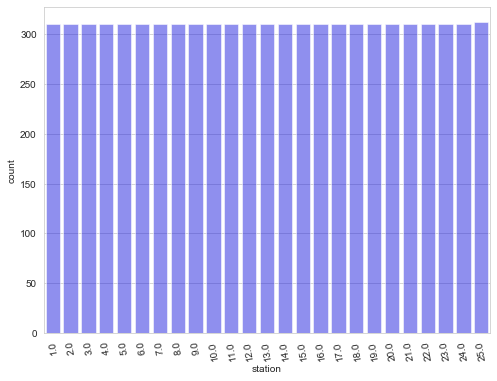

In [98]:
fig, ax = plt.subplots(figsize=(8,6))
sns.countplot(df1['station'].sort_values(), ax=ax, color='b', alpha=0.5)
plt.xticks(rotation=100)
plt.show()

In the above countplot almost all the stations have same amount of reading that is around 300 each.

In [99]:
#making seperate columns of year, month and day:
df['year'] = pd.DatetimeIndex(df['Date']).year
df['month'] = pd.DatetimeIndex(df['Date']).month
df['Day'] = pd.DatetimeIndex(df['Date']).day
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,Day
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,2013,6,30
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,2013,6,30
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,2013,6,30
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,2013,6,30
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,2013,6,30


Text(0.5, 1.0, 'Station VS Temperature max')

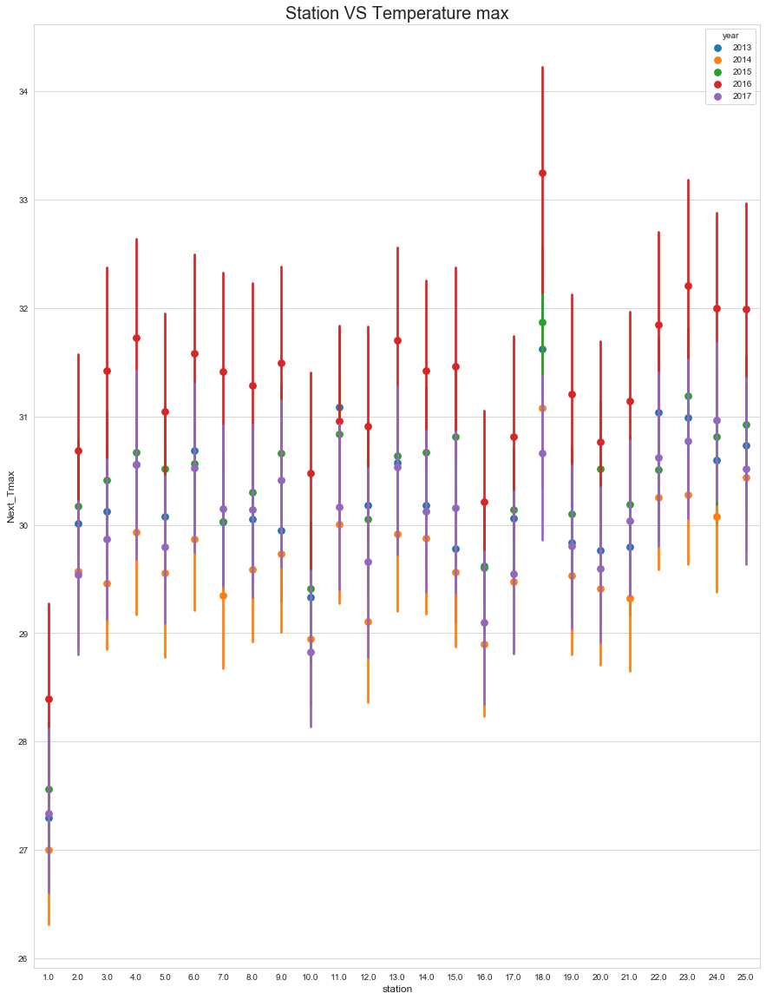

In [100]:
plt.figure(figsize=(15,20))
sns.set_style('whitegrid')
sns.pointplot(x='station', y='Next_Tmax', data=df, hue='year',join=False)
plt.xlabel('station',{'fontsize' : 'large'})
plt.ylabel('Next_Tmax',{'fontsize':'large'})
plt.title("Station VS Temperature max",{'fontsize':20})

The above graph is the plotting of Next_day maximum temperature year wise with respect to the all 25 stations, thus our findings are as follows:

1. Station 18 is showing the maximum temperatue over all the years and having the maximum temp i.e. above 33 in 2016

2. Station 01 is showing the lowest temperature among all the stations showing 27 and below in 2014.

3. Station 23 is also showing temperature higher whichis around 32 in 2016.

4. 2016 ( red line ) is the hottest year for all the stations, with the increase in the year the max temperature is also rising. 

Text(0.5, 1.0, 'Station VS Temperature min')

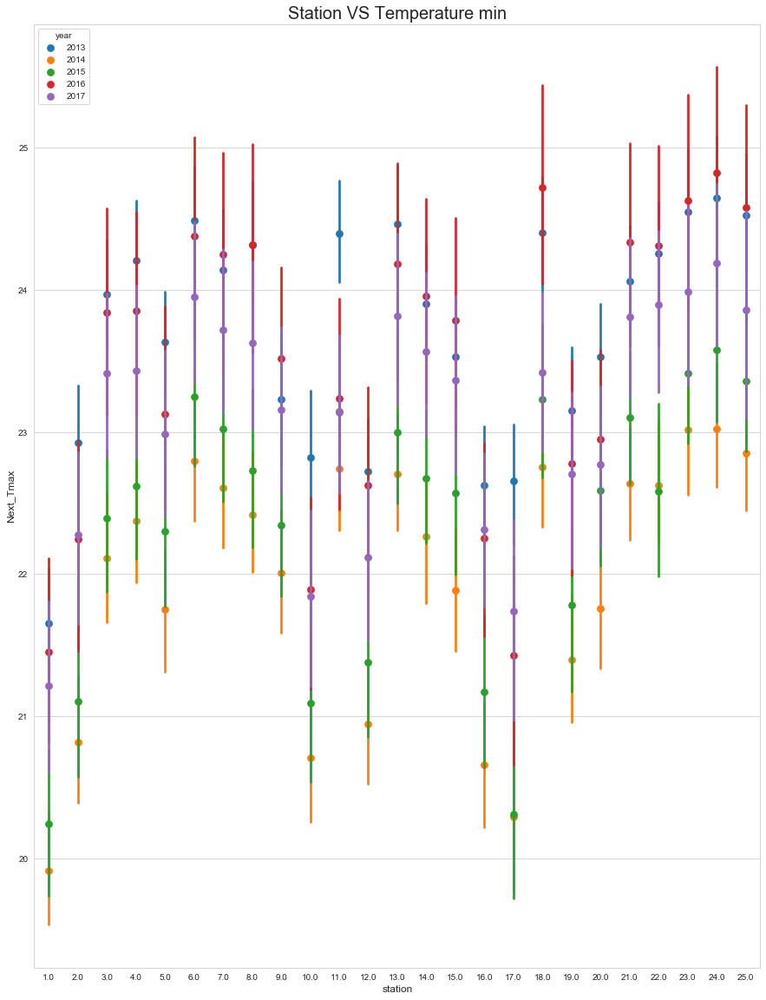

In [101]:
plt.figure(figsize=(15,20))
sns.set_style('whitegrid')
sns.pointplot(x='station', y='Next_Tmin', data=df, hue='year',join=False)
plt.xlabel('station',{'fontsize' : 'large'})
plt.ylabel('Next_Tmax',{'fontsize':'large'})
plt.title("Station VS Temperature min",{'fontsize':20})

The above graph is the plotting of Next_day mainimum temperature year wise with respect to the all 25 stations, thus our findings are as follows:

1. Station 24 is showing the maximum temperatue over all the years and having the maximum temp touching 25 degree in the year 2016

2. Station 01 is showing the lowest temperature among all the stations showing 20 and below in 2014.

3. Station 17 is also showing temperature lower than most of the other stations which is  in between 20 and 21 in 2014 and 2015.

4. 2014 and 2015 ( orange and green line ) are the coolest year for all the stations, with the increase in the year the min temperature is also rising.

In [102]:
# Dropping Date column:
df.drop("Date", axis=1,inplace=True)

### Removing outliers

In [103]:
from scipy.stats import zscore
z_score=abs(zscore(df))
print(df.shape)

(7752, 27)


In [104]:
df_out=df.loc[(z_score<3).all(axis=1)]
print(df_out.shape)

(6877, 27)


### Skewness

In [105]:
df_out.skew()

station             0.002549
Present_Tmax       -0.274655
Present_Tmin       -0.220286
LDAPS_RHmin         0.306557
LDAPS_RHmax        -0.673899
LDAPS_Tmax_lapse   -0.123150
LDAPS_Tmin_lapse   -0.377871
LDAPS_WS            1.094623
LDAPS_LH            0.573553
LDAPS_CC1           0.576111
LDAPS_CC2           0.496944
LDAPS_CC3           0.698337
LDAPS_CC4           0.706098
LDAPS_PPT1          3.637983
LDAPS_PPT2          4.858258
LDAPS_PPT3          5.484668
LDAPS_PPT4          5.955834
lat                 0.108345
lon                -0.274949
DEM                 1.764176
Slope               1.593425
Solar radiation    -0.508573
Next_Tmax          -0.267642
Next_Tmin          -0.234850
year                0.006008
month              -0.186158
Day                -0.006222
dtype: float64

In [106]:
#Treatment for the skewed data:
for col in df_out.columns:
    if df_out.skew().loc[col]>0.55:
        df_out[col]=np.log1p(df_out[col])

In [107]:
df_out.skew()

station             0.002549
Present_Tmax       -0.274655
Present_Tmin       -0.220286
LDAPS_RHmin         0.306557
LDAPS_RHmax        -0.673899
LDAPS_Tmax_lapse   -0.123150
LDAPS_Tmin_lapse   -0.377871
LDAPS_WS            0.481734
LDAPS_LH           -0.612651
LDAPS_CC1           0.312354
LDAPS_CC2           0.496944
LDAPS_CC3           0.435115
LDAPS_CC4           0.492955
LDAPS_PPT1          2.685589
LDAPS_PPT2          3.637290
LDAPS_PPT3          4.207404
LDAPS_PPT4          4.633886
lat                 0.108345
lon                -0.274949
DEM                 0.450650
Slope               0.847623
Solar radiation    -0.508573
Next_Tmax          -0.267642
Next_Tmin          -0.234850
year                0.006008
month              -0.186158
Day                -0.006222
dtype: float64

In [108]:
df_max=pd.DataFrame(data=df_out)
df_max

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,Day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.210218,...,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,2013,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.203356,...,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,2013,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.190078,...,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,2013,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.195873,...,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,2013,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.140985,...,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,2013,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,2.028576,2.362181,0.051550,...,37.5507,127.040,3.306813,0.452412,4456.024414,27.6,17.7,2017,8,30
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,1.912218,4.420607,0.064346,...,37.5102,127.086,3.134050,0.125045,4441.803711,28.0,17.1,2017,8,30
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,1.966961,4.291258,0.029592,...,37.5372,126.891,2.808655,0.144447,4443.313965,28.3,18.1,2017,8,30
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,2.020596,3.876219,0.035245,...,37.5237,126.909,2.906661,0.200734,4438.373535,28.6,18.8,2017,8,30


In [109]:
df_min=pd.DataFrame(data=df_out)
df_min

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,Day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.210218,...,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,2013,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.203356,...,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,2013,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.190078,...,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,2013,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.195873,...,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,2013,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.140985,...,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,2013,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,2.028576,2.362181,0.051550,...,37.5507,127.040,3.306813,0.452412,4456.024414,27.6,17.7,2017,8,30
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,1.912218,4.420607,0.064346,...,37.5102,127.086,3.134050,0.125045,4441.803711,28.0,17.1,2017,8,30
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,1.966961,4.291258,0.029592,...,37.5372,126.891,2.808655,0.144447,4443.313965,28.3,18.1,2017,8,30
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,2.020596,3.876219,0.035245,...,37.5237,126.909,2.906661,0.200734,4438.373535,28.6,18.8,2017,8,30


###  1 df_max to Predict Next_Tmax

In [110]:
# Dropping columns which are not correlating with target variable:
df_max.drop("LDAPS_RHmin", axis=1,inplace=True)
df_max.drop("LDAPS_CC1", axis=1,inplace=True)
df_max.drop("LDAPS_CC2", axis=1,inplace=True)
df_max.drop("LDAPS_CC3", axis=1,inplace=True)
df_max.drop("LDAPS_CC4", axis=1,inplace=True)
df_max.drop("LDAPS_WS", axis=1,inplace=True)
df_max.drop("Day", axis=1,inplace=True)
df_max.head(2)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month
0,1.0,28.7,21.4,91.116364,28.074101,23.006936,4.254929,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,2013,6
1,2.0,31.9,21.6,90.604721,29.850689,24.035009,3.969111,0.0,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,2013,6


In [113]:
df_max.shape

(6877, 20)

In [112]:
mid = df_max['Next_Tmax']
df_max.drop(labels=['Next_Tmax'], axis=1, inplace = True)
df_max.insert(0, 'Next_Tmax', mid)
df_max.head(2)

,Next_Tmax,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,year,month
0,29.1,1.0,28.7,21.4,91.116364,28.074101,23.006936,4.254929,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,21.2,2013,6
1,30.5,2.0,31.9,21.6,90.604721,29.850689,24.035009,3.969111,0.0,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,22.5,2013,6


In [120]:
df_max.isnull().sum()

Next_Tmax           0
station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_LH            1
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmin           0
year                0
month               0
dtype: int64

In [121]:
df_max["LDAPS_LH"] = df_max["LDAPS_LH"].fillna(df_max["LDAPS_LH"].dropna().mode().values[0] )

### Assigning X AND Y Variables:

In [122]:
x=df_max.iloc[:,1:20]
x.shape
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,year,month
0,1.0,28.7,21.4,91.116364,28.074101,23.006936,4.254929,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,21.2,2013,6
1,2.0,31.9,21.6,90.604721,29.850689,24.035009,3.969111,0.0,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,22.5,2013,6
2,3.0,31.6,23.3,83.973587,30.091292,24.565633,3.071445,0.0,0.0,0.0,0.0,37.5776,127.058,3.535344,0.235941,5863.555664,23.9,2013,6
3,4.0,32.0,23.4,96.483688,29.704629,23.326177,4.200612,0.0,0.0,0.0,0.0,37.6450,127.022,3.844087,1.262657,5856.964844,24.3,2013,6
4,5.0,31.4,21.9,90.155128,29.113934,23.486480,4.691032,0.0,0.0,0.0,0.0,37.5507,127.135,3.584574,0.409125,5859.552246,22.5,2013,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,78.261383,27.812697,18.303014,2.362181,0.0,0.0,0.0,0.0,37.5507,127.040,3.306813,0.452412,4456.024414,17.7,2017,8
7746,22.0,22.5,17.4,83.690018,26.704905,17.814038,4.420607,0.0,0.0,0.0,0.0,37.5102,127.086,3.134050,0.125045,4441.803711,17.1,2017,8
7747,23.0,23.3,17.1,78.869858,26.352081,18.775678,4.291258,0.0,0.0,0.0,0.0,37.5372,126.891,2.808655,0.144447,4443.313965,18.1,2017,8
7748,24.0,23.3,17.7,77.294975,27.010193,18.733519,3.876219,0.0,0.0,0.0,0.0,37.5237,126.909,2.906661,0.200734,4438.373535,18.8,2017,8


In [123]:
y=df_max.iloc[:,0:1]
y.shape
y.head()

,Next_Tmax
0,29.1
1,30.5
2,31.1
3,31.7
4,31.2


### Standard Scaler:
To bring all the values at the same scale

In [124]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler(copy=True, with_mean=True, with_std=True).fit(x)
df1_scaler = scaler.transform(x)
x = pd.DataFrame(df1_scaler)
x.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,-1.672572,-0.433839,-0.824257,0.440881,-0.665826,-0.300478,0.458927,-0.407164,-0.339541,-0.306702,-0.275367,1.215079,0.002687,2.090916,1.332960,1.548014,-0.797517,-1.430481,-2.795604
1,-1.533653,0.680685,-0.737870,0.367419,-0.019635,0.158516,-0.004204,-0.407164,-0.339541,-0.306702,-0.275367,1.215079,0.517350,-0.026446,-0.501243,1.254355,-0.247070,-1.430481,-2.795604
2,-1.394733,0.576198,-0.003580,-0.584690,0.067878,0.395419,-1.458757,-0.407164,-0.339541,-0.306702,-0.275367,0.674616,0.843722,-0.422738,-0.859345,1.240675,0.345719,-1.430481,-2.795604
3,-1.255813,0.715513,0.039613,1.211530,-0.072761,-0.157949,0.370913,-0.407164,-0.339541,-0.306702,-0.275367,2.023772,0.391823,0.001922,1.196050,1.225014,0.515087,-1.430481,-2.795604
4,-1.116893,0.506540,-0.608289,0.302866,-0.287612,-0.086381,1.165576,-0.407164,-0.339541,-0.306702,-0.275367,0.136154,1.810286,-0.355024,-0.512646,1.231162,-0.247070,-1.430481,-2.795604


## MODEL SELECTION
Using different types of model in oder to acquire optimum solution:

In [125]:
def maxr2_score(regr,x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.20,random_state=r_state)
        regr.fit(x_train,y_train)
        y_pred=regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("r2_score corresponding to random state: ",r_state,"is: ",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print()
    print()
    print("max r2_score correspondint to: ",final_r_state,"is ",max_r_score)
    return final_r_state

### Linear Regression

In [126]:
lreg=LinearRegression()
r_state=maxr2_score(lreg,x,y)

r2_score corresponding to random state:  42 is:  0.7413728369774143
r2_score corresponding to random state:  43 is:  0.7618287318115795
r2_score corresponding to random state:  44 is:  0.7480744815548819
r2_score corresponding to random state:  45 is:  0.7374546485827445
r2_score corresponding to random state:  46 is:  0.7644627471838765
r2_score corresponding to random state:  47 is:  0.7539858407275373
r2_score corresponding to random state:  48 is:  0.7598046968805809
r2_score corresponding to random state:  49 is:  0.7419057206244024
r2_score corresponding to random state:  50 is:  0.7290290942326652
r2_score corresponding to random state:  51 is:  0.7263631476748231
r2_score corresponding to random state:  52 is:  0.7607439037787904
r2_score corresponding to random state:  53 is:  0.7556843628797898
r2_score corresponding to random state:  54 is:  0.7762210012035523
r2_score corresponding to random state:  55 is:  0.7550185334181677
r2_score corresponding to random state:  56 is: 

### KNeighborsRegressor

In [127]:
from sklearn.neighbors import KNeighborsRegressor
neighbors={"n_neighbors":range(1,30)}
knn= KNeighborsRegressor()
gknn=GridSearchCV(knn,neighbors,cv=10)
gknn.fit(x,y)
gknn.best_params_

{'n_neighbors': 29}

In [128]:
knn= KNeighborsRegressor(n_neighbors=29)
r_state=maxr2_score(knn,x,y)

r2_score corresponding to random state:  42 is:  0.7114886774835406
r2_score corresponding to random state:  43 is:  0.727267581378801
r2_score corresponding to random state:  44 is:  0.713265962692984
r2_score corresponding to random state:  45 is:  0.7014386219854126
r2_score corresponding to random state:  46 is:  0.7362016256564623
r2_score corresponding to random state:  47 is:  0.701917599441743
r2_score corresponding to random state:  48 is:  0.7260453440828548
r2_score corresponding to random state:  49 is:  0.7085670870543086
r2_score corresponding to random state:  50 is:  0.6991708284873546
r2_score corresponding to random state:  51 is:  0.7035069847767665
r2_score corresponding to random state:  52 is:  0.7325806964515048
r2_score corresponding to random state:  53 is:  0.7166598446736082
r2_score corresponding to random state:  54 is:  0.7232238176306303
r2_score corresponding to random state:  55 is:  0.7211885722512883
r2_score corresponding to random state:  56 is:  0.

### Lasso

In [129]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
isreh=Lasso()
parameters={"alpha":[0.001,0.01,0.1,1]}
grid=GridSearchCV(isreh,parameters,cv=10)
grid.fit(x,y)
grid.best_params_

{'alpha': 0.01}

In [130]:
max_r_score=0
for r_state in range(42,100):
    x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=.20,random_state=r_state)
    lasso=Lasso(alpha=0.01)
    lasso.fit(x_train,y_train)
    y_pred=lasso.predict(x_test)
    r2_scr=r2_score(y_test,y_pred)
    print("r2_score corresponding to random state: ",r_state,"is: ",r2_scr)
    if r2_scr>max_r_score:
        max_r_score=r2_scr
        final_r_state=r_state
print()
print()
print("max r2_score correspondint to: ",final_r_state,"is ",max_r_score)

r2_score corresponding to random state:  42 is:  0.7413007504747773
r2_score corresponding to random state:  43 is:  0.761759812260594
r2_score corresponding to random state:  44 is:  0.7460125502849342
r2_score corresponding to random state:  45 is:  0.7382423383882668
r2_score corresponding to random state:  46 is:  0.7650917352770483
r2_score corresponding to random state:  47 is:  0.7534662379787649
r2_score corresponding to random state:  48 is:  0.7587742541572838
r2_score corresponding to random state:  49 is:  0.741301836961566
r2_score corresponding to random state:  50 is:  0.7283146447481833
r2_score corresponding to random state:  51 is:  0.7268966511974544
r2_score corresponding to random state:  52 is:  0.7599545287991625
r2_score corresponding to random state:  53 is:  0.7539332190637925
r2_score corresponding to random state:  54 is:  0.7751240160763155
r2_score corresponding to random state:  55 is:  0.7540126739480133
r2_score corresponding to random state:  56 is:  0

In [131]:
#Errors:
print('Mean absolute error : ',mean_absolute_error(y_test,y_pred))
print('Mean Squared error : ',mean_squared_error(y_test,y_pred))
print("RMSE is : ",np.sqrt(mean_squared_error(y_test,y_pred)))

Mean absolute error :  1.123861473026743
Mean Squared error :  2.105203390936976
RMSE is :  1.4509319043073579


In [132]:
from math import log
from math import sqrt
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
estimator = RandomForestRegressor()
param_grid = { 
            "n_estimators"      : [10,50,100,200,500],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8],
            "bootstrap": [True, False],
            }

grid = GridSearchCV(estimator, param_grid, n_jobs=-1, cv=5)

grid.fit(x_train, y_train)

grid.best_params_

{'bootstrap': False,
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 500}

In [133]:
rr=RandomForestRegressor(bootstrap=False,max_features='log2',min_samples_split=2,n_estimators=500)
rr.fit(x_train, y_train)
rr.score(x_train,y_train)

0.9999999957853216

In [134]:
pred=rr.predict(x_test)
pred

array([28.0616, 29.6232, 31.117 , ..., 30.7398, 32.036 , 32.1404])

In [135]:
print("Test Results for Random Forest Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test,pred)))
print("R-squared: ", r2_score(y_test,pred))

Test Results for Random Forest Regressor Model:
--------------------------------------------------
Root mean squared error:  0.963697597754421
R-squared:  0.8920737727959646


### DecisionTreeRegressor

In [136]:
from sklearn.tree import DecisionTreeRegressor
depth =list(range(3,30))
param_grid =dict(max_depth =depth)
tree =GridSearchCV(DecisionTreeRegressor(),param_grid,cv =10)
tree.fit(x_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                             max_depth=None, max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort='deprecated',
                                             random_state=None,
                                             splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14,
                                       15, 16, 17, 18, 19, 20, 21, 22, 23,

In [137]:
print(tree.best_estimator_)
tree.best_params_

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=8,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')


{'max_depth': 8}

In [138]:
y_train_pred =tree.predict(x_train)
y_test_pred =tree.predict(x_test)

In [139]:
print("Train Results for Decision Tree Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_train.values, y_train_pred)))
print("R-squared: ", r2_score(y_train.values, y_train_pred))

Train Results for Decision Tree Regressor Model:
--------------------------------------------------
Root mean squared error:  1.1666530199841225
R-squared:  0.8421962149844795


In [140]:
print("Test Results for Decision Tree Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test, y_test_pred)))
print("R-squared: ", r2_score(y_test, y_test_pred))

Test Results for Decision Tree Regressor Model:
--------------------------------------------------
Root mean squared error:  1.4707283676814122
R-squared:  0.7486317733359619


### GradientBoostingRegressor

In [141]:
from sklearn.ensemble import GradientBoostingRegressor
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.20)
model = GradientBoostingRegressor()
parameters = {'learning_rate': [0.001,0.01,0.1,0.02,0.03,1],
              'subsample'    : [0.9, 0.5, 0.2],
              'n_estimators' : [100,500,1000],
              'max_depth'    : [4,6,8]}
grid = GridSearchCV(estimator=model, param_grid = parameters, cv = 2, n_jobs=-1)
grid.fit(x_train, y_train)
grid.best_params_

{'learning_rate': 0.03, 'max_depth': 6, 'n_estimators': 1000, 'subsample': 0.5}

In [143]:
gbr= GradientBoostingRegressor(learning_rate=0.03,max_depth=6,n_estimators=1000,subsample=0.5)
gbr.fit(x_train, y_train)
gbr.score(x_train,y_train)

0.9900006752739179

In [145]:
pred_gbr=gbr.predict(x_test)
pred_gbr

array([27.94141718, 29.80946351, 30.97359947, ..., 31.03906657,
       32.69621502, 32.57999438])

In [146]:
print("Test Results for GradientBoostingRegressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test,pred_gbr)))
print("R-squared: ", r2_score(y_test,pred_gbr))

Test Results for Random Forest Regressor Model:
--------------------------------------------------
Root mean squared error:  0.8727092477282904
R-squared:  0.9114915777964138


### Cross_val_score

In [147]:
print("Mean r2 score for Linear Regression: ",cross_val_score(lreg,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for Linear Regression: ",cross_val_score(lreg,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for knn: ",cross_val_score(knn,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for knn: ",cross_val_score(knn,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for R_forest Regressor ",cross_val_score(rr,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for R_forst Regressor ",cross_val_score(rr,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for lasso ",cross_val_score(lasso,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for lasso ",cross_val_score(lasso,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for GBR ",cross_val_score(gbr,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for GBR ",cross_val_score(gbr,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for DTC ",cross_val_score(tree,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for DTC ",cross_val_score(tree,x,y,cv=5,scoring="r2").std())

Mean r2 score for Linear Regression:  0.6652432877821354
Standard Deviation r2 score for Linear Regression:  0.06684562671913243


Mean r2 score for knn:  0.4953459229843551
Standard Deviation r2 score for knn:  0.0840119055006434


Mean r2 score for R_forest Regressor  0.6623819686523011
Standard Deviation r2 score for R_forst Regressor  0.08162233807149478


Mean r2 score for lasso  0.6678897789476483
Standard Deviation r2 score for lasso  0.068033409266972


Mean r2 score for GBR  0.6754861947805737
Standard Deviation r2 score for GBR  0.058986311629830285


Mean r2 score for DTC  0.6087878504273301
Standard Deviation r2 score for DTC  0.057134055954697914


## Choosing A Model

In above all the models I am going to choose GradientBoostingRegressor as the best and final model for the production or prediction of the next day maximum temperature.

I am going to choose this model as it is predicting the accuracy score of 99.00% where as where the test result also shows almost 91% which is grater than any other model which have been tested above, there is only 1 model Random forest regressor 99% which is nearest to the GradientBoostingRegressor  but Random forest regressor test result score is still less than GradientBoostingRegressor.

Hence I am choosing GradientBoostingRegressor Model

## Saving The File:

In [148]:
from sklearn.externals import joblib

In [149]:
joblib.dump(gbr,'Project_17_Temperatureforecast_MAX_analysis.obj')

['Project_17_Temperatureforecast_MAX_analysis.obj']

In [150]:
##loading back the model:
model=joblib.load('Project_17_Temperatureforecast_MAX_analysis.obj')

In [151]:
#Pridicting x_test with GradientBoostingRegressor Model= gbr
gbr.predict(x_test)

array([27.94141718, 29.80946351, 30.97359947, ..., 31.03906657,
       32.69621502, 32.57999438])

### 2 df_min to Predict Next_Tmin

In [152]:
df_min

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,Day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.210218,...,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,2013,6,30
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.203356,...,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,2013,6,30
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.190078,...,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,2013,6,30
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.195873,...,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,2013,6,30
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.140985,...,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,2013,6,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,78.261383,27.812697,18.303014,2.028576,2.362181,0.051550,...,37.5507,127.040,3.306813,0.452412,4456.024414,27.6,17.7,2017,8,30
7746,22.0,22.5,17.4,30.094858,83.690018,26.704905,17.814038,1.912218,4.420607,0.064346,...,37.5102,127.086,3.134050,0.125045,4441.803711,28.0,17.1,2017,8,30
7747,23.0,23.3,17.1,26.741310,78.869858,26.352081,18.775678,1.966961,4.291258,0.029592,...,37.5372,126.891,2.808655,0.144447,4443.313965,28.3,18.1,2017,8,30
7748,24.0,23.3,17.7,24.040634,77.294975,27.010193,18.733519,2.020596,3.876219,0.035245,...,37.5237,126.909,2.906661,0.200734,4438.373535,28.6,18.8,2017,8,30


In [155]:
# Dropping columns which are not correlating with target variable:
df_min.drop("LDAPS_PPT4", axis=1,inplace=True)
df_min.drop("DEM", axis=1,inplace=True)
df_min.drop("Slope", axis=1,inplace=True)
df_min.drop("Day", axis=1,inplace=True)
df_min.drop("LDAPS_RHmax", axis=1,inplace=True)
df_min.head(2)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,lat,lon,Solar radiation,Next_Tmax,Next_Tmin,year,month
0,1.0,28.7,21.4,58.255688,28.074101,23.006936,2.056542,4.254929,0.210218,0.203896,...,0.0,0.0,0.0,37.6046,126.991,5992.895996,29.1,21.2,2013,6
1,2.0,31.9,21.6,52.263397,29.850689,24.035009,1.900896,3.969111,0.203356,0.251771,...,0.0,0.0,0.0,37.6046,127.032,5869.312500,30.5,22.5,2013,6


In [156]:
mid = df_min['Next_Tmin']
df_min.drop(labels=['Next_Tmin'], axis=1, inplace = True)
df_min.insert(0, 'Next_Tmin', mid)
df_min.head(2)

,Next_Tmin,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,lat,lon,Solar radiation,Next_Tmax,year,month
0,21.2,1.0,28.7,21.4,58.255688,28.074101,23.006936,2.056542,4.254929,0.210218,...,0.123039,0.0,0.0,0.0,37.6046,126.991,5992.895996,29.1,2013,6
1,22.5,2.0,31.9,21.6,52.263397,29.850689,24.035009,1.900896,3.969111,0.203356,...,0.120204,0.0,0.0,0.0,37.6046,127.032,5869.312500,30.5,2013,6


In [167]:
df_min.isnull().sum()

Next_Tmin           0
station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            1
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
lat                 0
lon                 0
Solar radiation     0
Next_Tmax           0
year                0
month               0
dtype: int64

In [175]:
df_min["LDAPS_LH"] = df_min["LDAPS_LH"].fillna(df_min["LDAPS_LH"].dropna().mode().values[0] )

In [176]:
df_min.isnull().sum()

Next_Tmin           0
station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
lat                 0
lon                 0
Solar radiation     0
Next_Tmax           0
year                0
month               0
dtype: int64

### Assigning X AND Y Variables:

In [177]:
x=df_min.iloc[:,1:22]
x.shape
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,lat,lon,Solar radiation,Next_Tmax,year,month
0,1.0,28.7,21.4,58.255688,28.074101,23.006936,2.056542,4.254929,0.210218,0.203896,...,0.123039,0.0,0.0,0.0,37.6046,126.991,5992.895996,29.1,2013,6
1,2.0,31.9,21.6,52.263397,29.850689,24.035009,1.900896,3.969111,0.203356,0.251771,...,0.120204,0.0,0.0,0.0,37.6046,127.032,5869.312500,30.5,2013,6
2,3.0,31.6,23.3,48.690479,30.091292,24.565633,1.965464,3.071445,0.190078,0.257469,...,0.132891,0.0,0.0,0.0,37.5776,127.058,5863.555664,31.1,2013,6
3,4.0,32.0,23.4,58.239788,29.704629,23.326177,1.894624,4.200612,0.195873,0.226002,...,0.125970,0.0,0.0,0.0,37.6450,127.022,5856.964844,31.7,2013,6
4,5.0,31.4,21.9,56.174095,29.113934,23.486480,1.907318,4.691032,0.140985,0.249995,...,0.157022,0.0,0.0,0.0,37.5507,127.135,5859.552246,31.2,2013,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,27.812697,18.303014,2.028576,2.362181,0.051550,0.030169,...,0.004370,0.0,0.0,0.0,37.5507,127.040,4456.024414,27.6,2017,8
7746,22.0,22.5,17.4,30.094858,26.704905,17.814038,1.912218,4.420607,0.064346,0.024518,...,0.017523,0.0,0.0,0.0,37.5102,127.086,4441.803711,28.0,2017,8
7747,23.0,23.3,17.1,26.741310,26.352081,18.775678,1.966961,4.291258,0.029592,0.081035,...,0.000000,0.0,0.0,0.0,37.5372,126.891,4443.313965,28.3,2017,8
7748,24.0,23.3,17.7,24.040634,27.010193,18.733519,2.020596,3.876219,0.035245,0.074962,...,0.000000,0.0,0.0,0.0,37.5237,126.909,4438.373535,28.6,2017,8


In [178]:
y=df_min.iloc[:,0:1]
y.shape
y.head()

,Next_Tmin
0,21.2
1,22.5
2,23.9
3,24.3
4,22.5


### Standard Scaler:
To bring all the values at the same scale

In [179]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler(copy=True, with_mean=True, with_std=True).fit(x)
df1_scaler = scaler.transform(x)
x = pd.DataFrame(df1_scaler)
x.head(5)

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-1.672572,-0.433839,-0.824257,0.190921,-0.665826,-0.300478,0.090824,0.458927,-0.389335,-0.533334,...,-0.592361,-0.407164,-0.339541,-0.306702,1.215079,0.002687,1.548014,-0.493615,-1.430481,-2.795604
1,-1.533653,0.680685,-0.737870,-0.241203,-0.019635,0.158516,-0.615536,-0.004204,-0.427027,-0.334062,...,-0.608343,-0.407164,-0.339541,-0.306702,1.215079,0.517350,1.254355,-0.016837,-1.430481,-2.795604
2,-1.394733,0.576198,-0.003580,-0.498858,0.067878,0.395419,-0.322512,-1.458757,-0.499951,-0.310345,...,-0.536806,-0.407164,-0.339541,-0.306702,0.674616,0.843722,1.240675,0.187496,-1.430481,-2.795604
3,-1.255813,0.715513,0.039613,0.189774,-0.072761,-0.157949,-0.643999,0.370913,-0.468124,-0.441320,...,-0.575829,-0.407164,-0.339541,-0.306702,2.023772,0.391823,1.225014,0.391829,-1.430481,-2.795604
4,-1.116893,0.506540,-0.608289,0.040810,-0.287612,-0.086381,-0.586391,1.165576,-0.769581,-0.341455,...,-0.400734,-0.407164,-0.339541,-0.306702,0.136154,1.810286,1.231162,0.221552,-1.430481,-2.795604


## MODEL SELECTION
Using different types of model in oder to acquire optimum solution:

In [180]:
def maxr2_score(regr,x,y):
    max_r_score=0
    for r_state in range(42,100):
        x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.20,random_state=r_state)
        regr.fit(x_train,y_train)
        y_pred=regr.predict(x_test)
        r2_scr=r2_score(y_test,y_pred)
        print("r2_score corresponding to random state: ",r_state,"is: ",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print()
    print()
    print("max r2_score correspondint to: ",final_r_state,"is ",max_r_score)
    return final_r_state

### Linear Regression

In [181]:
lreg=LinearRegression()
r_state=maxr2_score(lreg,x,y)

r2_score corresponding to random state:  42 is:  0.8290834331787708
r2_score corresponding to random state:  43 is:  0.8282132452939857
r2_score corresponding to random state:  44 is:  0.8245069920672874
r2_score corresponding to random state:  45 is:  0.8200313153829093
r2_score corresponding to random state:  46 is:  0.8302536815791105
r2_score corresponding to random state:  47 is:  0.8219439143996479
r2_score corresponding to random state:  48 is:  0.8276582426784752
r2_score corresponding to random state:  49 is:  0.8265850928661245
r2_score corresponding to random state:  50 is:  0.824253571680465
r2_score corresponding to random state:  51 is:  0.8255525414865936
r2_score corresponding to random state:  52 is:  0.8363051491570673
r2_score corresponding to random state:  53 is:  0.825567269687802
r2_score corresponding to random state:  54 is:  0.8307993814597059
r2_score corresponding to random state:  55 is:  0.8275562792953997
r2_score corresponding to random state:  56 is:  0

In [182]:
from sklearn.neighbors import KNeighborsRegressor
neighbors={"n_neighbors":range(1,30)}
knn= KNeighborsRegressor()
gknn=GridSearchCV(knn,neighbors,cv=10)
gknn.fit(x,y)
gknn.best_params_

{'n_neighbors': 29}

In [183]:
knn= KNeighborsRegressor(n_neighbors=29)
r_state=maxr2_score(knn,x,y)

r2_score corresponding to random state:  42 is:  0.8455459757372679
r2_score corresponding to random state:  43 is:  0.847781005820432
r2_score corresponding to random state:  44 is:  0.833996602426569
r2_score corresponding to random state:  45 is:  0.837014286747458
r2_score corresponding to random state:  46 is:  0.8389991787790776
r2_score corresponding to random state:  47 is:  0.8398066880730133
r2_score corresponding to random state:  48 is:  0.8409857115202184
r2_score corresponding to random state:  49 is:  0.835862166406562
r2_score corresponding to random state:  50 is:  0.8352384127888496
r2_score corresponding to random state:  51 is:  0.8409444372439406
r2_score corresponding to random state:  52 is:  0.8457190445678815
r2_score corresponding to random state:  53 is:  0.8344421845453063
r2_score corresponding to random state:  54 is:  0.8409434259876196
r2_score corresponding to random state:  55 is:  0.8479680992082169
r2_score corresponding to random state:  56 is:  0.8

In [184]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
isreh=Lasso()
parameters={"alpha":[0.001,0.01,0.1,1]}
grid=GridSearchCV(isreh,parameters,cv=10)
grid.fit(x,y)
grid.best_params_

{'alpha': 0.1}

In [185]:
max_r_score=0
for r_state in range(42,100):
    x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=.20,random_state=r_state)
    lasso=Lasso(alpha=0.1)
    lasso.fit(x_train,y_train)
    y_pred=lasso.predict(x_test)
    r2_scr=r2_score(y_test,y_pred)
    print("r2_score corresponding to random state: ",r_state,"is: ",r2_scr)
    if r2_scr>max_r_score:
        max_r_score=r2_scr
        final_r_state=r_state
print()
print()
print("max r2_score correspondint to: ",final_r_state,"is ",max_r_score)

r2_score corresponding to random state:  42 is:  0.8188698557698122
r2_score corresponding to random state:  43 is:  0.8191325923036595
r2_score corresponding to random state:  44 is:  0.8074690455107933
r2_score corresponding to random state:  45 is:  0.8106603739087584
r2_score corresponding to random state:  46 is:  0.8168082259287479
r2_score corresponding to random state:  47 is:  0.8146745006284661
r2_score corresponding to random state:  48 is:  0.8130182989715036
r2_score corresponding to random state:  49 is:  0.8141974714146228
r2_score corresponding to random state:  50 is:  0.8066473712712467
r2_score corresponding to random state:  51 is:  0.8148662090221918
r2_score corresponding to random state:  52 is:  0.8220788573443788
r2_score corresponding to random state:  53 is:  0.8108274631098842
r2_score corresponding to random state:  54 is:  0.8153388052052456
r2_score corresponding to random state:  55 is:  0.8161884844692362
r2_score corresponding to random state:  56 is: 

In [186]:
#Errors:
print('Mean absolute error : ',mean_absolute_error(y_test,y_pred))
print('Mean Squared error : ',mean_squared_error(y_test,y_pred))
print("RMSE is : ",np.sqrt(mean_squared_error(y_test,y_pred)))

Mean absolute error :  0.7852030000855764
Mean Squared error :  1.0045059244910737
RMSE is :  1.0022504300278816


### RandomForestRegressor

In [187]:
from math import log
from math import sqrt
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
estimator = RandomForestRegressor()
param_grid = { 
            "n_estimators"      : [10,50,100,200,500],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8],
            "bootstrap": [True, False],
            }

grid = GridSearchCV(estimator, param_grid, n_jobs=-1, cv=5)

grid.fit(x_train, y_train)

grid.best_params_

{'bootstrap': False,
 'max_features': 'sqrt',
 'min_samples_split': 2,
 'n_estimators': 500}

In [188]:
rr_min=RandomForestRegressor(bootstrap=False,max_features='sqrt',min_samples_split=2,n_estimators=500)
rr_min.fit(x_train, y_train)
rr_min.score(x_train,y_train)

0.999999999827786

In [190]:
pred_min=rr_min.predict(x_test)
pred_min

array([23.7318, 25.7314, 24.3268, ..., 24.3178, 22.3712, 23.8648])

In [191]:
print("Test Results for Random Forest Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test,pred_min)))
print("R-squared: ", r2_score(y_test,pred_min))

Test Results for Random Forest Regressor Model:
--------------------------------------------------
Root mean squared error:  0.635998248429831
R-squared:  0.9275966988352696


### DecisionTreeRegressor 

In [192]:
from sklearn.tree import DecisionTreeRegressor
depth =list(range(3,30))
param_grid =dict(max_depth =depth)
tree_min=GridSearchCV(DecisionTreeRegressor(),param_grid,cv =10)
tree_min.fit(x_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse',
                                             max_depth=None, max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort='deprecated',
                                             random_state=None,
                                             splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14,
                                       15, 16, 17, 18, 19, 20, 21, 22, 23,

In [193]:
print(tree_min.best_estimator_)
tree_min.best_params_

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=8,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')


{'max_depth': 8}

In [194]:
y_train_pred =tree_min.predict(x_train)
y_test_pred =tree_min.predict(x_test)

In [195]:
print("Train Results for Decision Tree Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_train.values, y_train_pred)))
print("R-squared: ", r2_score(y_train.values, y_train_pred))

Train Results for Decision Tree Regressor Model:
--------------------------------------------------
Root mean squared error:  0.7998267903254304
R-squared:  0.8852195128823306


In [196]:
print("Test Results for Decision Tree Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test, y_test_pred)))
print("R-squared: ", r2_score(y_test, y_test_pred))

Test Results for Decision Tree Regressor Model:
--------------------------------------------------
Root mean squared error:  0.9761090439280576
R-squared:  0.8294533464801799


### GradientBoostingRegressor

In [197]:
from sklearn.ensemble import GradientBoostingRegressor
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.20)
model = GradientBoostingRegressor()
parameters = {'learning_rate': [0.001,0.01,0.1,0.02,0.03,1],
              'subsample'    : [0.9, 0.5, 0.2],
              'n_estimators' : [100,500,1000],
              'max_depth'    : [4,6,8]}
grid = GridSearchCV(estimator=model, param_grid = parameters, cv = 2, n_jobs=-1)
grid.fit(x_train, y_train)
grid.best_params_

{'learning_rate': 0.03, 'max_depth': 6, 'n_estimators': 1000, 'subsample': 0.5}

In [199]:
gbr_min= GradientBoostingRegressor(learning_rate=0.03,max_depth=6,n_estimators=1000,subsample=0.5)
gbr_min.fit(x_train, y_train)
gbr_min.score(x_train,y_train)

0.9952624070983386

In [201]:
pred_gbr_min=gbr_min.predict(x_test)
pred_gbr_min

array([19.88602659, 22.41019116, 23.58667346, ..., 21.87477748,
       20.74175486, 18.50390305])

In [202]:
print("Test Results for Random Forest Regressor Model:")
print(50 * '-')
print("Root mean squared error: ", sqrt(mean_squared_error(y_test,pred_gbr_min)))
print("R-squared: ", r2_score(y_test,pred_gbr_min))

Test Results for Random Forest Regressor Model:
--------------------------------------------------
Root mean squared error:  0.5592586481103318
R-squared:  0.9409413367504901


### Cross_val_score

In [203]:
print("Mean r2 score for Linear Regression: ",cross_val_score(lreg,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for Linear Regression: ",cross_val_score(lreg,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for knn: ",cross_val_score(knn,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for knn: ",cross_val_score(knn,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for R_forest Regressor ",cross_val_score(rr_min,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for R_forst Regressor ",cross_val_score(rr_min,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for lasso ",cross_val_score(lasso,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for lasso ",cross_val_score(lasso,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for GBR ",cross_val_score(gbr_min,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for GBR ",cross_val_score(gbr_min,x,y,cv=5,scoring="r2").std())
print()
print()
print("Mean r2 score for DTC ",cross_val_score(tree_min,x,y,cv=5,scoring="r2").mean())
print("Standard Deviation r2 score for DTC ",cross_val_score(tree_min,x,y,cv=5,scoring="r2").std())

Mean r2 score for Linear Regression:  0.7781450231613739
Standard Deviation r2 score for Linear Regression:  0.07538120395324835


Mean r2 score for knn:  0.6740223892975634
Standard Deviation r2 score for knn:  0.0940680397627228


Mean r2 score for R_forest Regressor  0.7752555900843344
Standard Deviation r2 score for R_forst Regressor  0.07552424039873071


Mean r2 score for lasso  0.7787397264960292
Standard Deviation r2 score for lasso  0.07155383274757937


Mean r2 score for GBR  0.799405284911795
Standard Deviation r2 score for GBR  0.06962510312183826


Mean r2 score for DTC  0.7037904520720394
Standard Deviation r2 score for DTC  0.08686278367323777


## Choosing a Model:

In above all the models I am going to choose GradientBoostingRegressor as the best and final model for the production or prediction of the next day # Minimum temperature.

I am going to choose this model as it is predicting the accuracy score of 99.54% where as where the test result also shows almost 94.1% which is grater than any other model which have been tested above, there is only 1 model Random forest regressor 99.99% which is nearest to the GradientBoostingRegressor but Random forest regressor test result i.e. 92% score is still less than GradientBoostingRegressor.

Hence I am choosing GradientBoostingRegressor Model

### Saving the Model:

In [204]:
from sklearn.externals import joblib

In [205]:
joblib.dump(gbr_min,'Project_17_Temperatureforecast_MIN_analysis.obj')

['Project_17_Temperatureforecast_MIN_analysis.obj']

In [206]:
##loading back the model:
model=joblib.load('Project_17_Temperatureforecast_MIN_analysis.obj')

In [207]:
#Pridicting x_test with GradientBoostingRegressor Model= gbr_min
gbr_min.predict(x_test)

array([19.88602659, 22.41019116, 23.58667346, ..., 21.87477748,
       20.74175486, 18.50390305])